<a href="https://www.kaggle.com/code/kalilurrahman/kaggle-playground-s5e4-play-podcast-eda?scriptVersionId=231026257" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
import numpy as np
import pandas as pd 
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
from cycler import cycler


raw_light_palette = [
    (0, 122, 255), # Blue
    (255, 149, 0), # Orange
    (52, 199, 89), # Green
    (255, 59, 48), # Red
    (175, 82, 222),# Purple
    (255, 45, 85), # Pink
    (88, 86, 214), # Indigo
    (90, 200, 250),# Teal
    (255, 204, 0)  # Yellow
]

raw_dark_palette = [
    (10, 132, 255), # Blue
    (255, 159, 10), # Orange
    (48, 209, 88),  # Green
    (255, 69, 58),  # Red
    (191, 90, 242), # Purple
    (94, 92, 230),  # Indigo
    (255, 55, 95),  # Pink
    (100, 210, 255),# Teal
    (255, 214, 10)  # Yellow
]

raw_gray_light_palette = [
    (142, 142, 147),# Gray
    (174, 174, 178),# Gray (2)
    (199, 199, 204),# Gray (3)
    (209, 209, 214),# Gray (4)
    (229, 229, 234),# Gray (5)
    (242, 242, 247),# Gray (6)
]

raw_gray_dark_palette = [
    (142, 142, 147),# Gray
    (99, 99, 102),  # Gray (2)
    (72, 72, 74),   # Gray (3)
    (58, 58, 60),   # Gray (4)
    (44, 44, 46),   # Gray (5)
    (28, 28, 39),   # Gray (6)
]


light_palette = np.array(raw_light_palette)/255
dark_palette = np.array(raw_dark_palette)/255
gray_light_palette = np.array(raw_gray_light_palette)/255
gray_dark_palette = np.array(raw_gray_dark_palette)/255

mpl.rcParams['axes.prop_cycle'] = cycler('color',dark_palette)
mpl.rcParams['figure.facecolor']  = gray_dark_palette[-2]
mpl.rcParams['figure.edgecolor']  = gray_dark_palette[-2]
mpl.rcParams['axes.facecolor'] =  gray_dark_palette[-2]

white_color = gray_light_palette[-2]
mpl.rcParams['text.color'] = white_color
mpl.rcParams['axes.labelcolor'] = white_color
mpl.rcParams['axes.edgecolor'] = white_color
mpl.rcParams['xtick.color'] = white_color
mpl.rcParams['ytick.color'] = white_color

mpl.rcParams['figure.dpi'] = 200

mpl.rcParams['axes.spines.top'] = False
mpl.rcParams['axes.spines.right'] = False

* Ref  : https://www.kaggle.com/subinium/dark-mode-visualization-apple-version

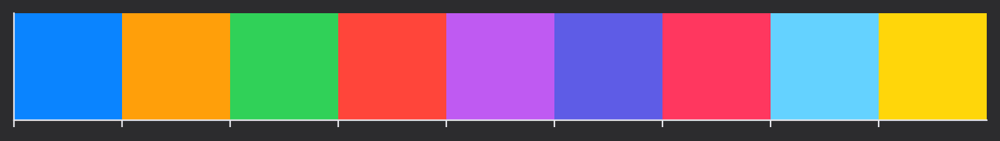

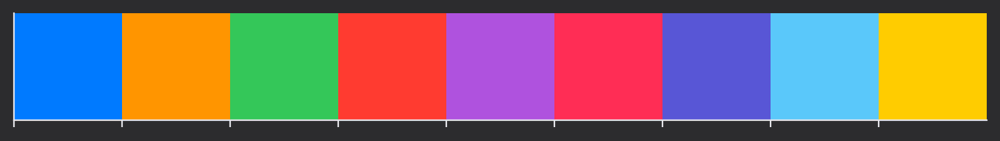

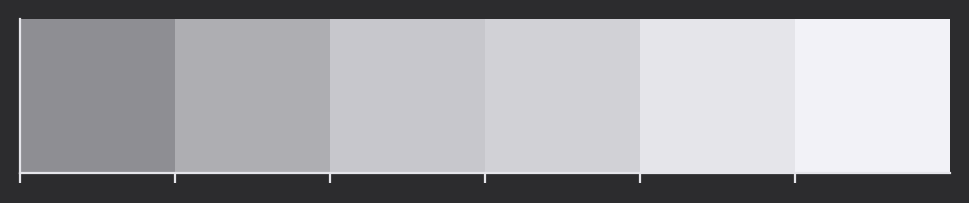

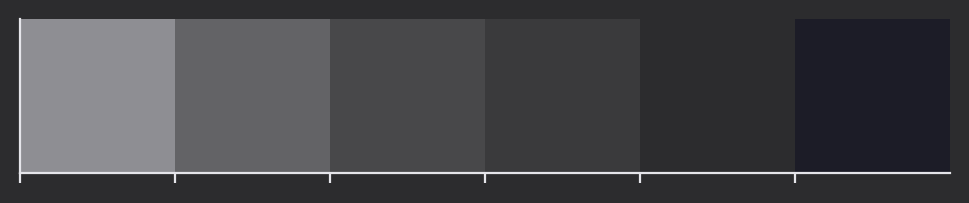

In [3]:
sns.palplot(dark_palette)
sns.palplot(light_palette)
sns.palplot(gray_light_palette)
sns.palplot(gray_dark_palette)

In [4]:
train = pd.read_csv('/kaggle/input/playground-series-s5e4/train.csv')
test = pd.read_csv('/kaggle/input/playground-series-s5e4/test.csv')
sample_submission = pd.read_csv('/kaggle/input/playground-series-s5e4/sample_submission.csv')

In [5]:
print(train.shape)
print(test.shape)
print(sample_submission.shape)

(750000, 12)
(250000, 11)
(250000, 2)


In [6]:
train.head(100)

,id,Podcast_Name,Episode_Title,Episode_Length_minutes,Genre,Host_Popularity_percentage,Publication_Day,Publication_Time,Guest_Popularity_percentage,Number_of_Ads,Episode_Sentiment,Listening_Time_minutes
0,0,Mystery Matters,Episode 98,NaN,True Crime,74.81,Thursday,Night,NaN,0.0,Positive,31.41998
1,1,Joke Junction,Episode 26,119.80,Comedy,66.95,Saturday,Afternoon,75.95,2.0,Negative,88.01241
2,2,Study Sessions,Episode 16,73.90,Education,69.97,Tuesday,Evening,8.97,0.0,Negative,44.92531
3,3,Digital Digest,Episode 45,67.17,Technology,57.22,Monday,Morning,78.70,2.0,Positive,46.27824
4,4,Mind & Body,Episode 86,110.51,Health,80.07,Monday,Afternoon,58.68,3.0,Neutral,75.61031
...,...,...,...,...,...,...,...,...,...,...,...,...
95,95,Mystery Matters,Episode 40,94.45,True Crime,53.37,Friday,Afternoon,36.36,0.0,Positive,66.59645
96,96,Home & Living,Episode 49,60.26,Lifestyle,34.26,Friday,Evening,51.18,1.0,Neutral,48.28618
97,97,Global News,Episode 85,26.72,News,60.73,Monday,Afternoon,24.90,2.0,Neutral,21.17921
98,98,Life Lessons,Episode 67,35.51,Lifestyle,94.42,Thursday,Evening,48.02,1.0,Neutral,24.11502


In [7]:
train = train.drop('id', axis=1)
test = test.drop('id', axis=1)

In [8]:
train.describe().T.style.bar(subset=['mean'], color='#205ff2')\
                            .background_gradient(subset=['std'], cmap='Reds')\
                            .background_gradient(subset=['50%'], cmap='coolwarm')

,count,mean,std,min,25%,50%,75%,max
Episode_Length_minutes,662907.000000,64.504738,32.969603,0.000000,35.730000,63.840000,94.070000,325.240000
Host_Popularity_percentage,750000.000000,59.859901,22.873098,1.300000,39.410000,60.050000,79.530000,119.460000
Guest_Popularity_percentage,603970.000000,52.236449,28.451241,0.000000,28.380000,53.580000,76.600000,119.910000
Number_of_Ads,749999.000000,1.348855,1.151130,0.000000,0.000000,1.000000,2.000000,103.910000
Listening_Time_minutes,750000.000000,45.437406,27.138306,0.000000,23.178350,43.379460,64.811580,119.970000


In [9]:
test.describe().T.style.bar(subset=['mean'], color='#205ff2')\
                            .background_gradient(subset=['std'], cmap='Reds')\
                            .background_gradient(subset=['50%'], cmap='coolwarm')

,count,mean,std,min,25%,50%,75%,max
Episode_Length_minutes,221264.000000,419.298741,166854.502468,2.470000,35.780000,63.970000,94.150000,78486264.000000
Host_Popularity_percentage,250000.000000,59.716491,22.880028,2.490000,39.250000,59.900000,79.390000,117.760000
Guest_Popularity_percentage,201168.000000,52.192796,28.445034,0.000000,28.320000,53.360000,76.560000,116.820000
Number_of_Ads,250000.000000,1.355852,4.274399,0.000000,0.000000,1.000000,2.000000,2063.000000


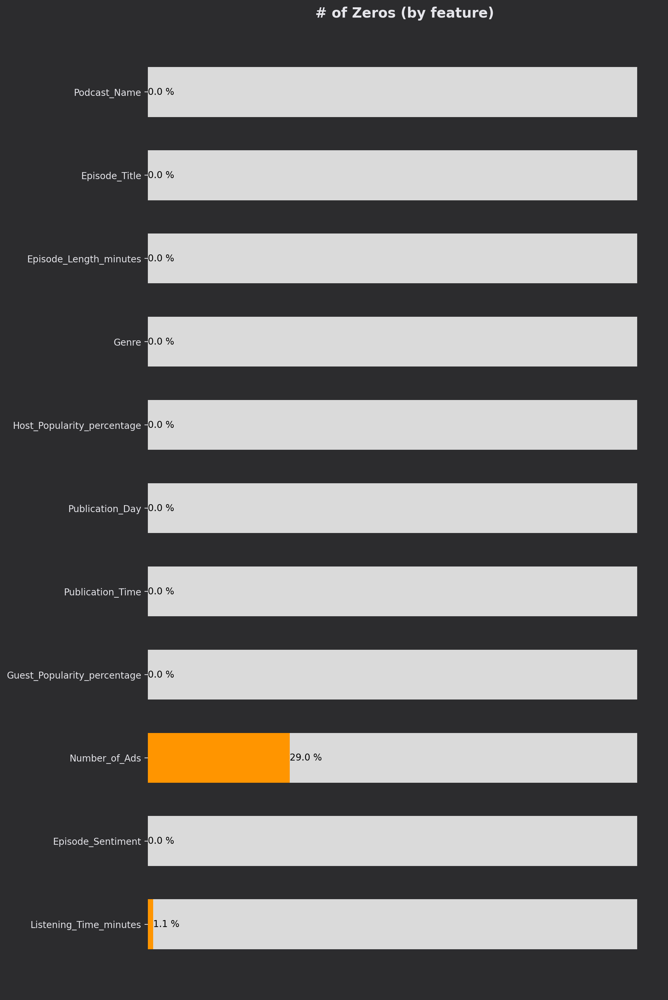

In [10]:
zero_data = ((train.iloc[:,:50]==0).sum() / len(train) * 100)[::-1]
fig, ax = plt.subplots(1,1,figsize=(10, 19))

ax.barh(zero_data.index, 100, color='#dadada', height=0.6)
barh = ax.barh(zero_data.index, zero_data, color=light_palette[1], height=0.6)
ax.bar_label(barh, fmt='%.01f %%', color='black')
ax.spines[['left', 'bottom']].set_visible(False)

ax.set_xticks([])

ax.set_title('# of Zeros (by feature)', loc='center', fontweight='bold', fontsize=15)    
plt.show()

In [11]:
label_dict = {val:idx for idx, val in enumerate(sorted(train['Listening_Time_minutes'].unique()))}
train['Listening_Time_minutes'] = train['Listening_Time_minutes'].map(label_dict)

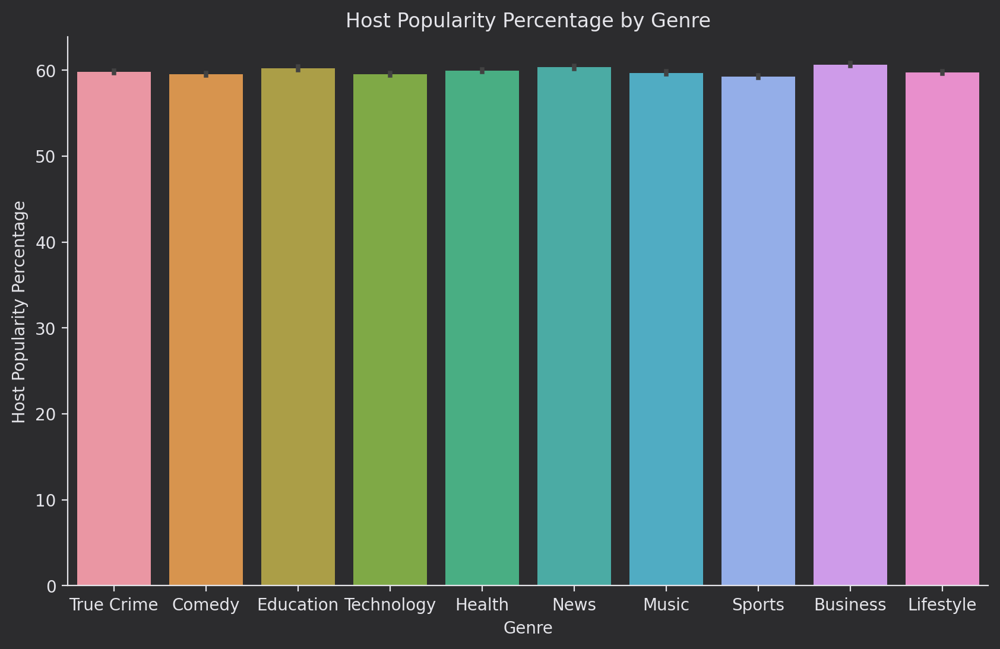

In [12]:
df=train
plt.figure(figsize=(10, 6))
sns.barplot(x='Genre', y='Host_Popularity_percentage', data=df)
plt.title('Host Popularity Percentage by Genre')
plt.xlabel('Genre')
plt.ylabel('Host Popularity Percentage')
plt.show()


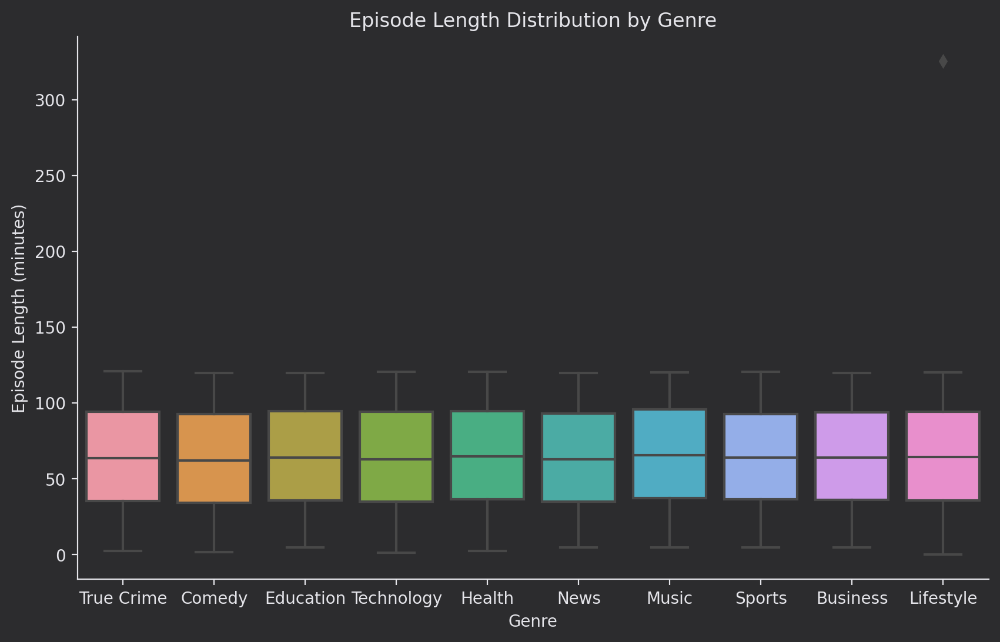

In [13]:

## 2. Box Plot of Episode Length
plt.figure(figsize=(10, 6))
sns.boxplot(x='Genre', y='Episode_Length_minutes', data=df)
plt.title('Episode Length Distribution by Genre')
plt.xlabel('Genre')
plt.ylabel('Episode Length (minutes)')
plt.show()


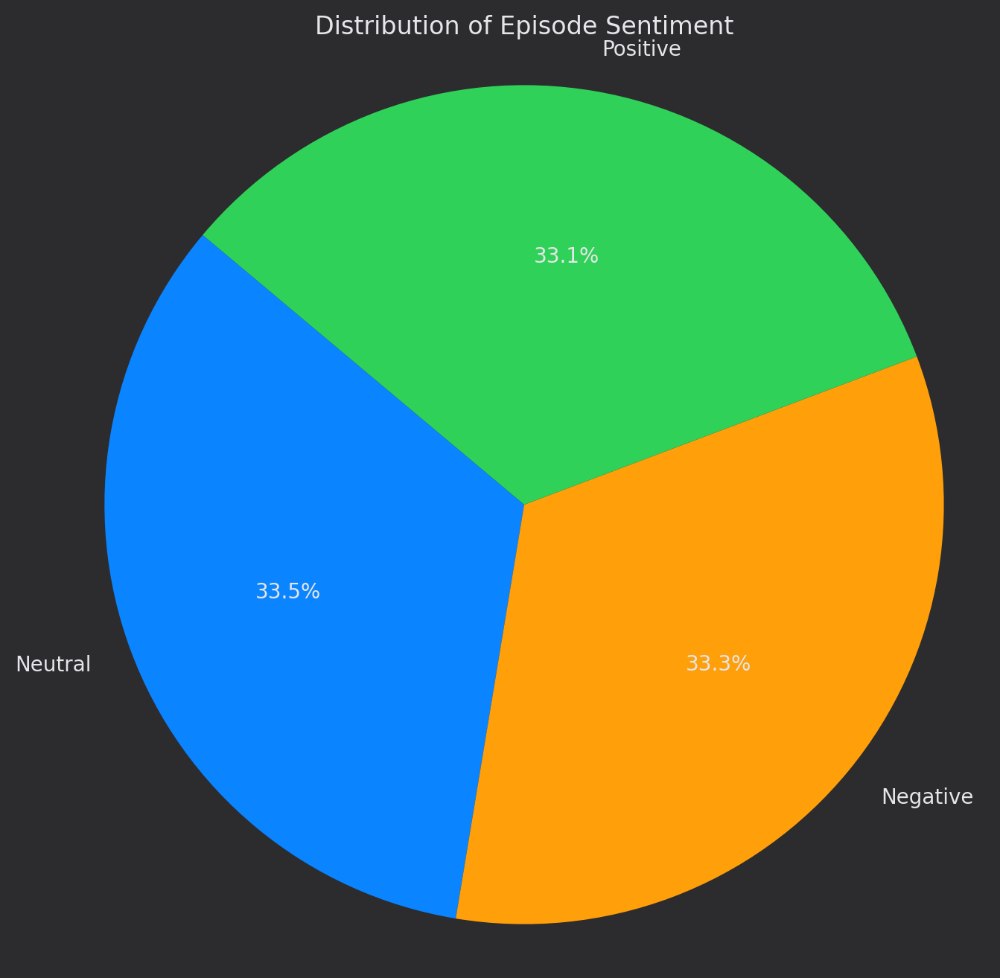

In [14]:

## 3. Pie Chart for Episode Sentiment Distribution
sentiment_counts = df['Episode_Sentiment'].value_counts()
plt.figure(figsize=(8, 8))
plt.pie(sentiment_counts, labels=sentiment_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Episode Sentiment')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()


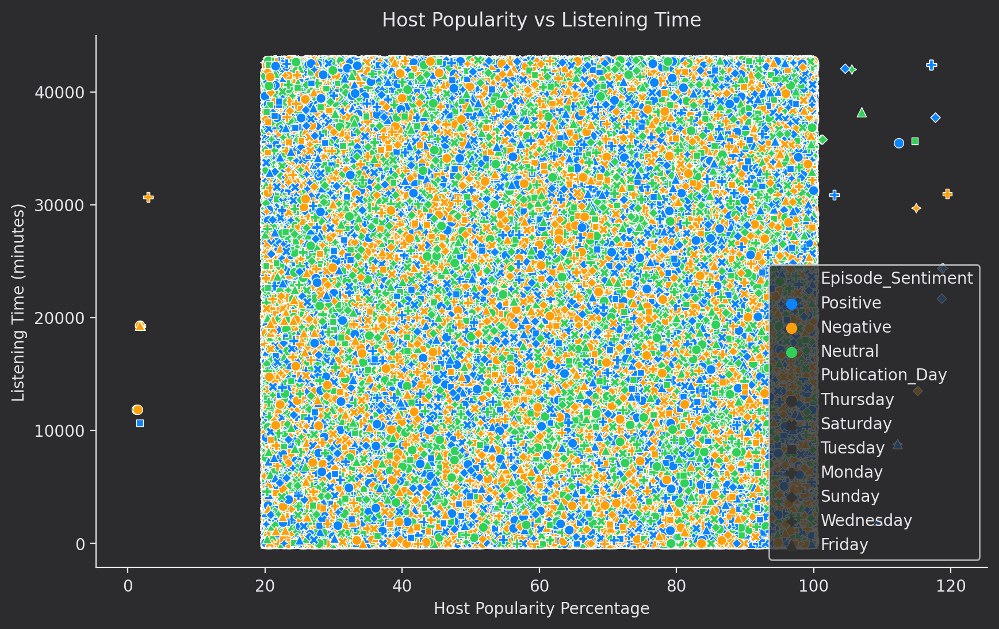

In [15]:

## 4. Scatter Plot of Host Popularity vs Listening Time
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Host_Popularity_percentage', y='Listening_Time_minutes', hue='Episode_Sentiment', style='Publication_Day', data=df)
plt.title('Host Popularity vs Listening Time')
plt.xlabel('Host Popularity Percentage')
plt.ylabel('Listening Time (minutes)')
plt.legend()
plt.show()


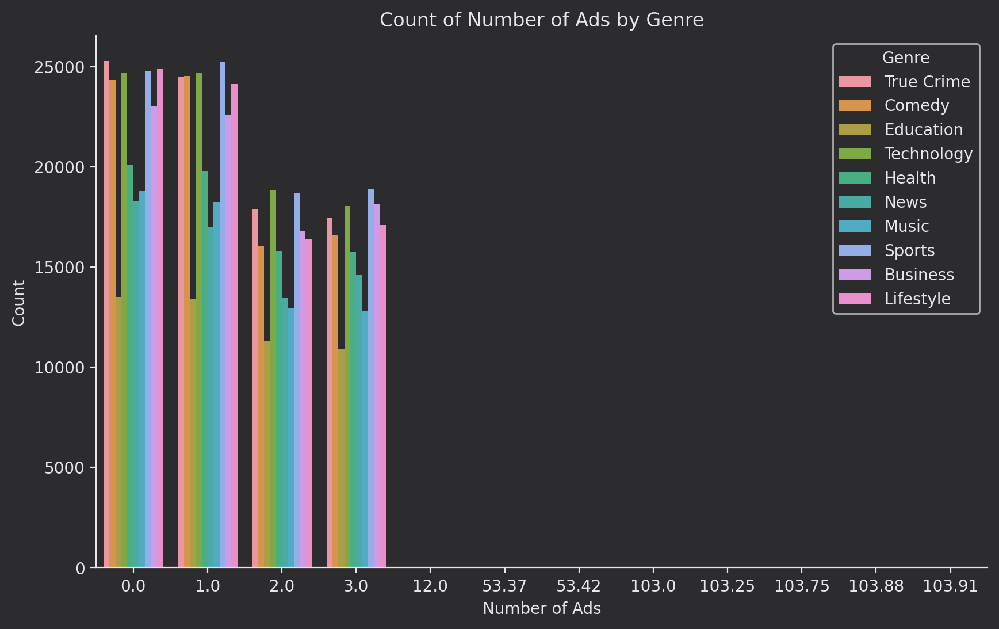

In [16]:

## 5. Count Plot of Number of Ads by Genre
plt.figure(figsize=(10, 6))
sns.countplot(x='Number_of_Ads', hue='Genre', data=df)
plt.title('Count of Number of Ads by Genre')
plt.xlabel('Number of Ads')
plt.ylabel('Count')
plt.show()

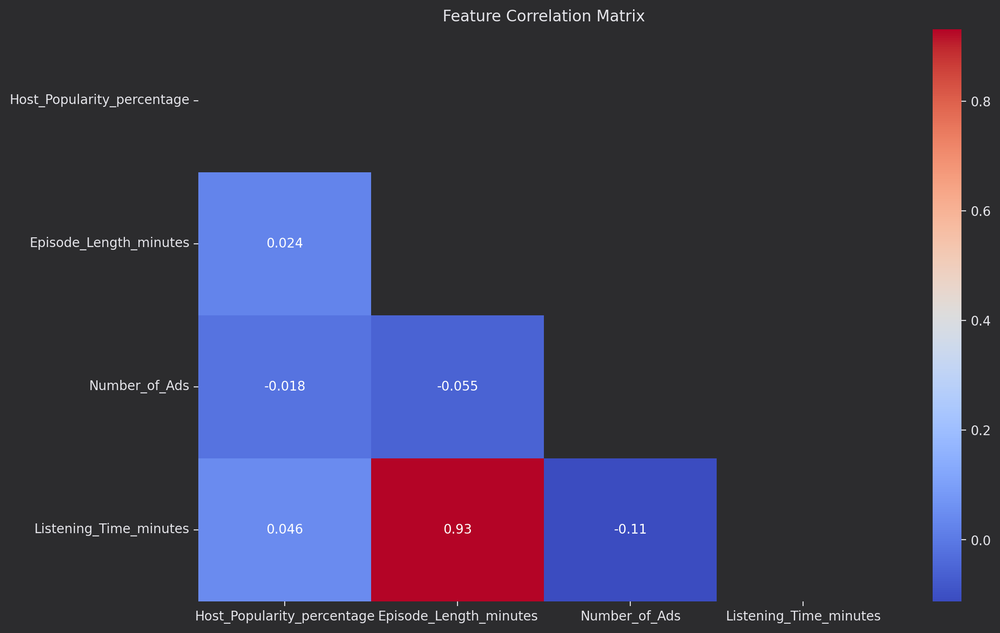

In [17]:
plt.figure(figsize=(12,8))
corr_matrix = df[['Host_Popularity_percentage', 'Episode_Length_minutes', 
                 'Number_of_Ads', 'Listening_Time_minutes']].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', mask=np.triu(corr_matrix))
plt.title('Feature Correlation Matrix')
plt.show()


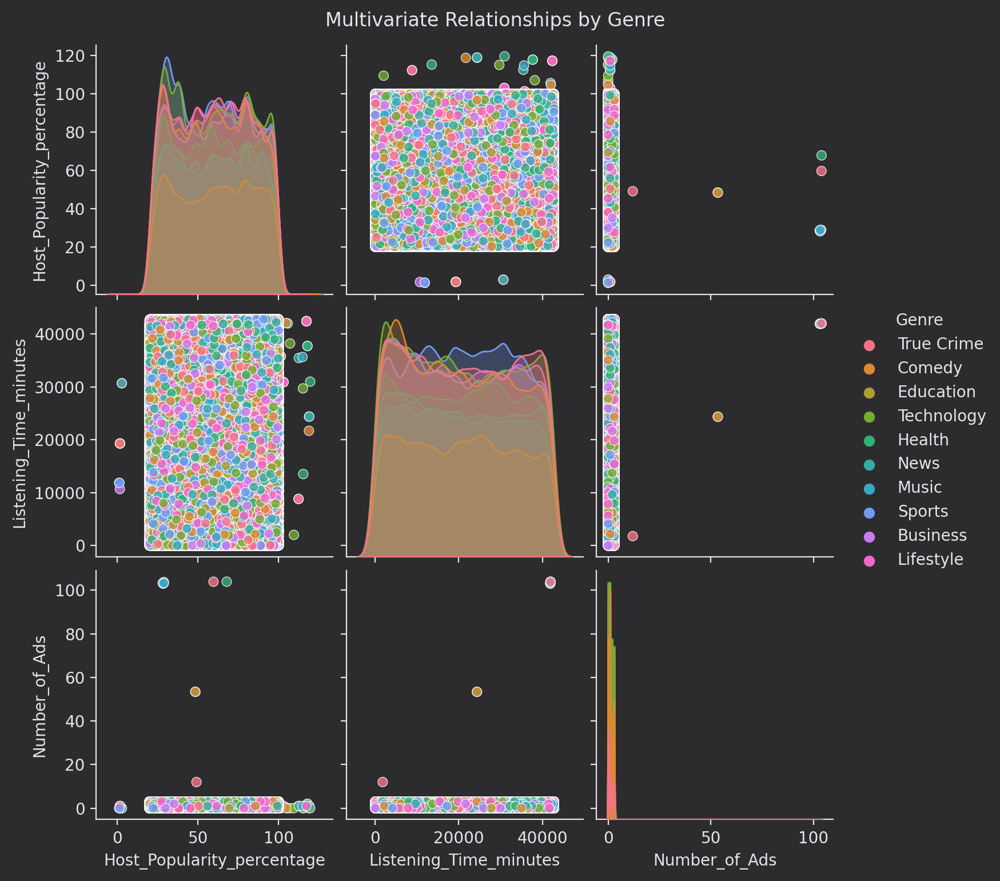

In [18]:
sns.pairplot(df, hue='Genre', 
            vars=['Host_Popularity_percentage', 'Listening_Time_minutes', 
                  'Number_of_Ads'],
            plot_kws={'alpha':0.8})
plt.suptitle('Multivariate Relationships by Genre', y=1.02)
plt.show()


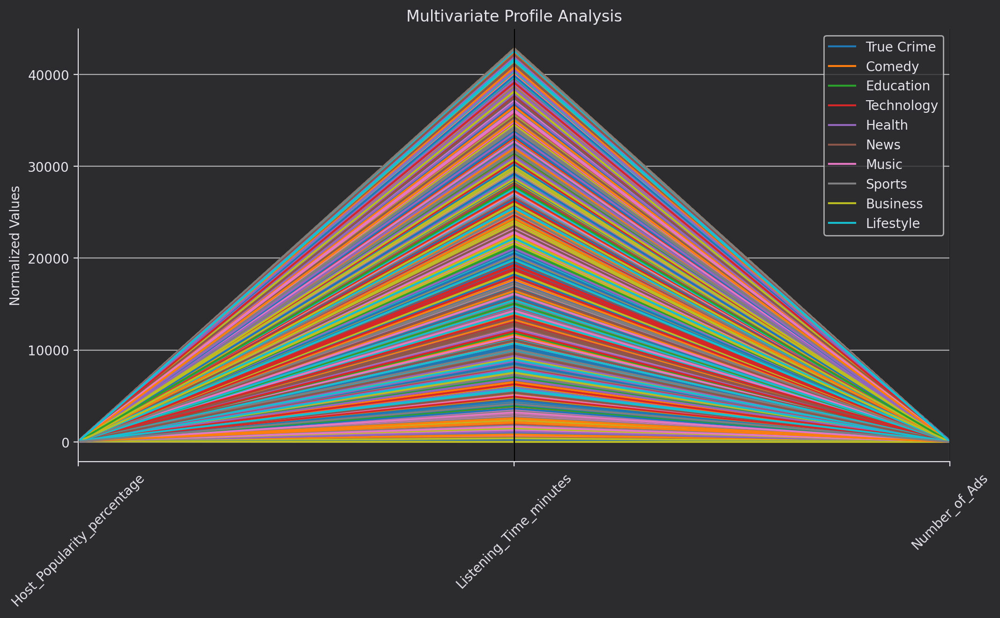

In [19]:
from pandas.plotting import parallel_coordinates

plt.figure(figsize=(12,6))
parallel_coordinates(df[['Genre', 'Host_Popularity_percentage', 
                        'Listening_Time_minutes', 'Number_of_Ads']], 
                    'Genre', colormap='tab10')
plt.title('Multivariate Profile Analysis')
plt.ylabel('Normalized Values')
plt.xticks(rotation=45)
plt.show()


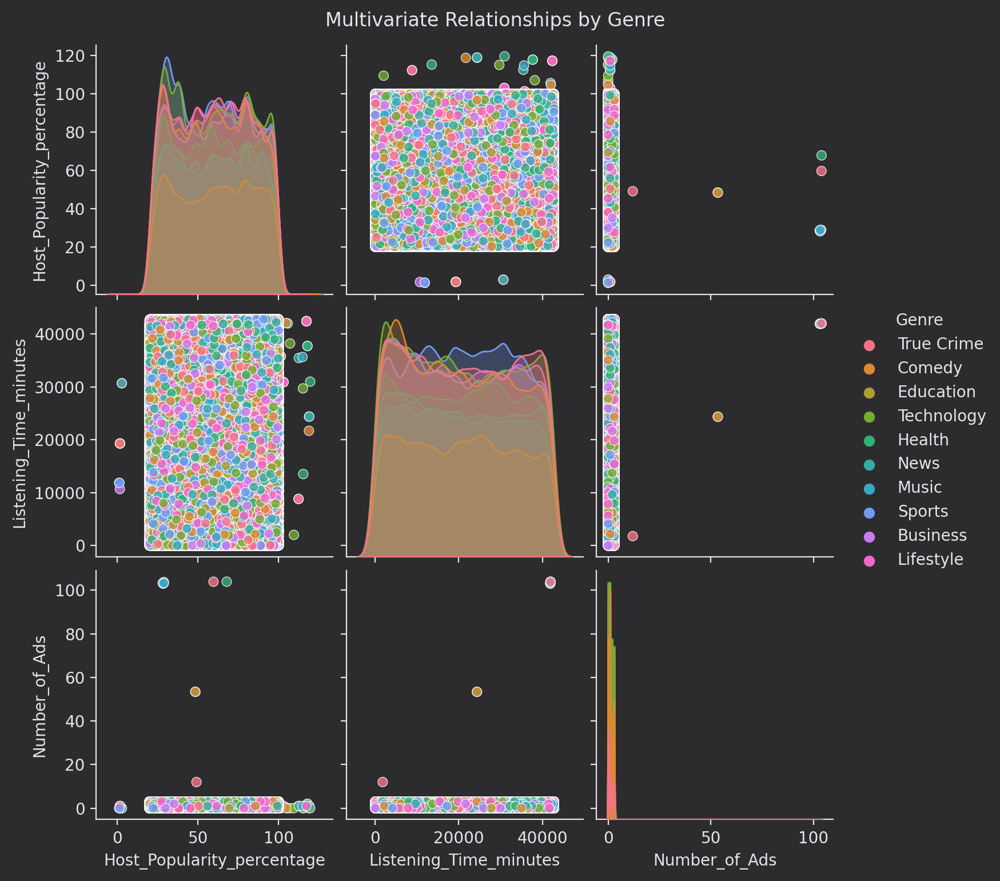

In [20]:
sns.pairplot(df, hue='Genre', 
            vars=['Host_Popularity_percentage', 'Listening_Time_minutes', 
                  'Number_of_Ads'],
            plot_kws={'alpha':0.8})
plt.suptitle('Multivariate Relationships by Genre', y=1.02)
plt.show()


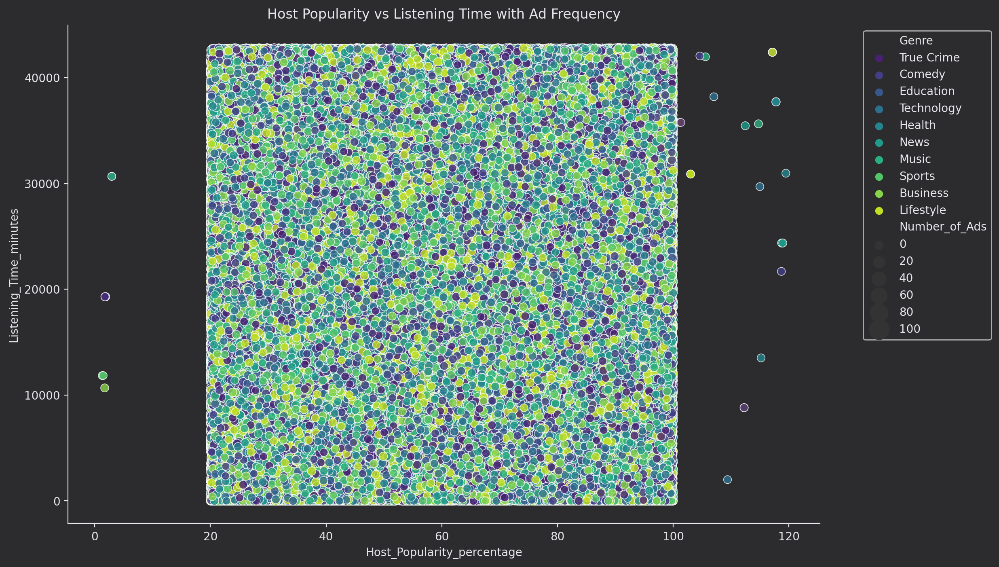

In [21]:
plt.figure(figsize=(12,8))
sns.scatterplot(data=df, x='Host_Popularity_percentage', 
               y='Listening_Time_minutes', hue='Genre',
               size='Number_of_Ads', sizes=(50, 300), 
               alpha=0.8, palette='viridis')
plt.title('Host Popularity vs Listening Time with Ad Frequency')
plt.legend(bbox_to_anchor=(1.05, 1))
plt.show()


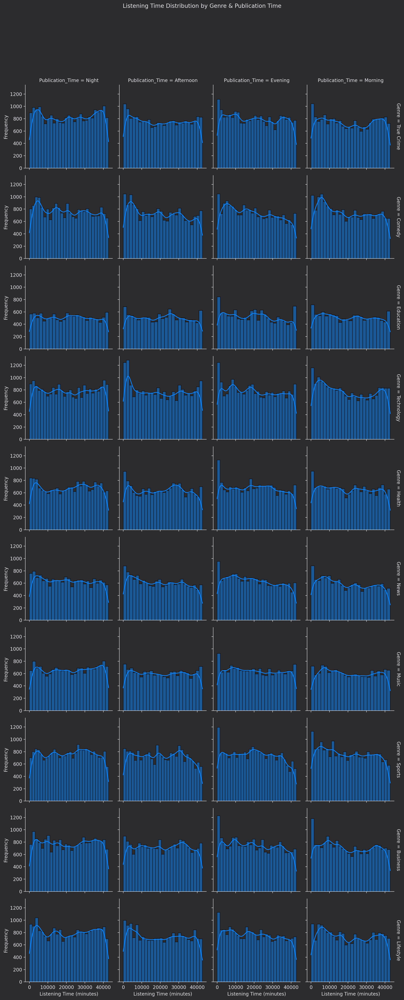

In [22]:
g = sns.FacetGrid(df, col='Publication_Time', row='Genre', margin_titles=True)
g.map(sns.histplot, 'Listening_Time_minutes', kde=True)
g.set_axis_labels('Listening Time (minutes)', 'Frequency')
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Listening Time Distribution by Genre & Publication Time')
plt.show()


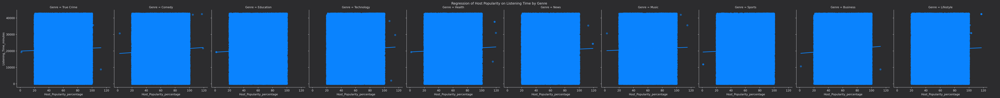

In [23]:
g = sns.FacetGrid(df, col='Genre', height=5, aspect=1)
g.map(sns.regplot, 'Host_Popularity_percentage', 'Listening_Time_minutes', ci=None, scatter_kws={'alpha':0.5})
g.add_legend()
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Regression of Host Popularity on Listening Time by Genre')
plt.show()


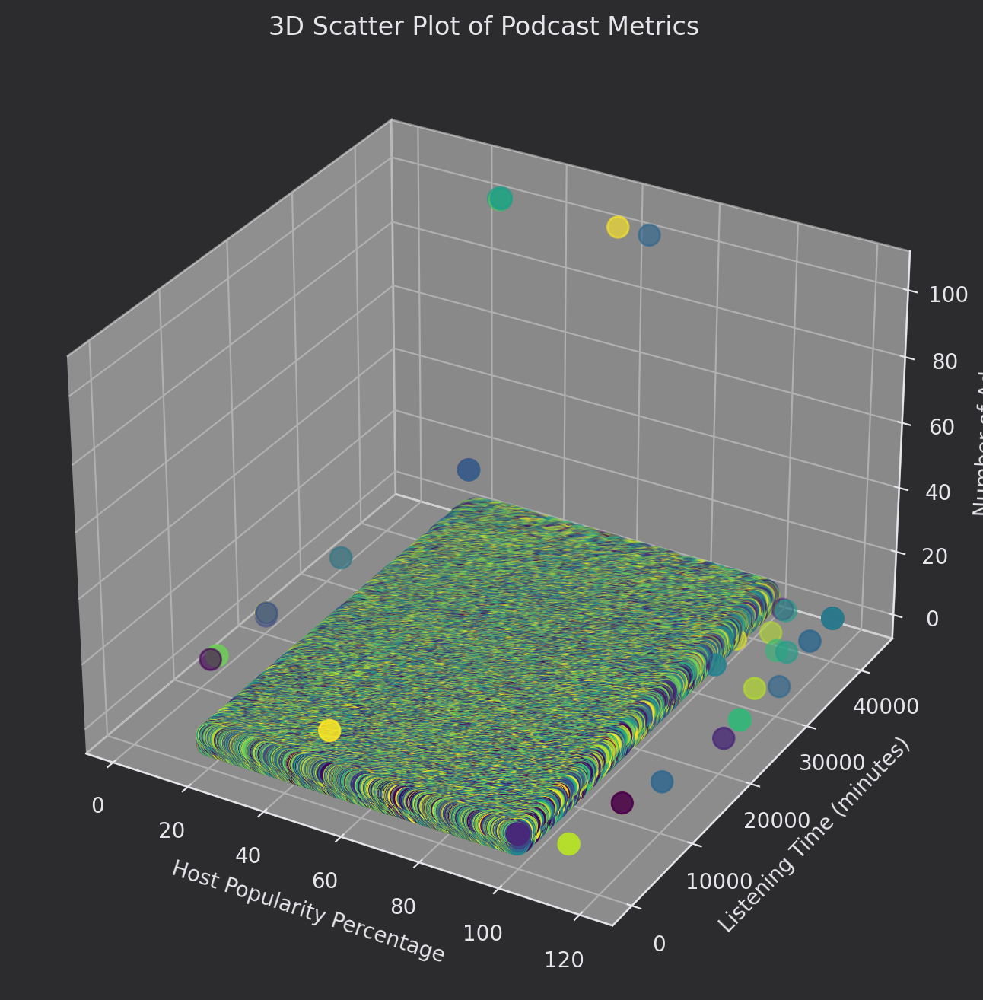

In [24]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot
ax.scatter(df['Host_Popularity_percentage'], 
           df['Listening_Time_minutes'], 
           df['Number_of_Ads'], 
           c=df['Genre'].astype('category').cat.codes, cmap='viridis', s=100)

ax.set_xlabel('Host Popularity Percentage')
ax.set_ylabel('Listening Time (minutes)')
ax.set_zlabel('Number of Ads')
plt.title('3D Scatter Plot of Podcast Metrics')
plt.show()


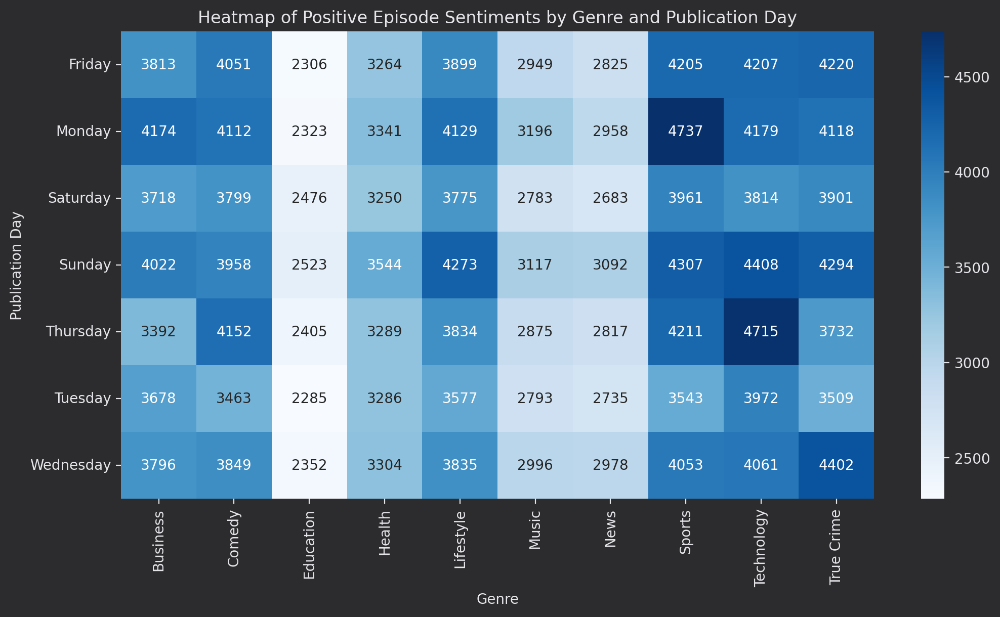

In [25]:
sentiment_heatmap = df.pivot_table(index='Publication_Day', 
                                    columns='Genre', 
                                    values='Episode_Sentiment', 
                                    aggfunc=lambda x: (x == 'Positive').sum())

plt.figure(figsize=(12,6))
sns.heatmap(sentiment_heatmap, annot=True, fmt='d', cmap='Blues')
plt.title('Heatmap of Positive Episode Sentiments by Genre and Publication Day')
plt.ylabel('Publication Day')
plt.xlabel('Genre')
plt.show()


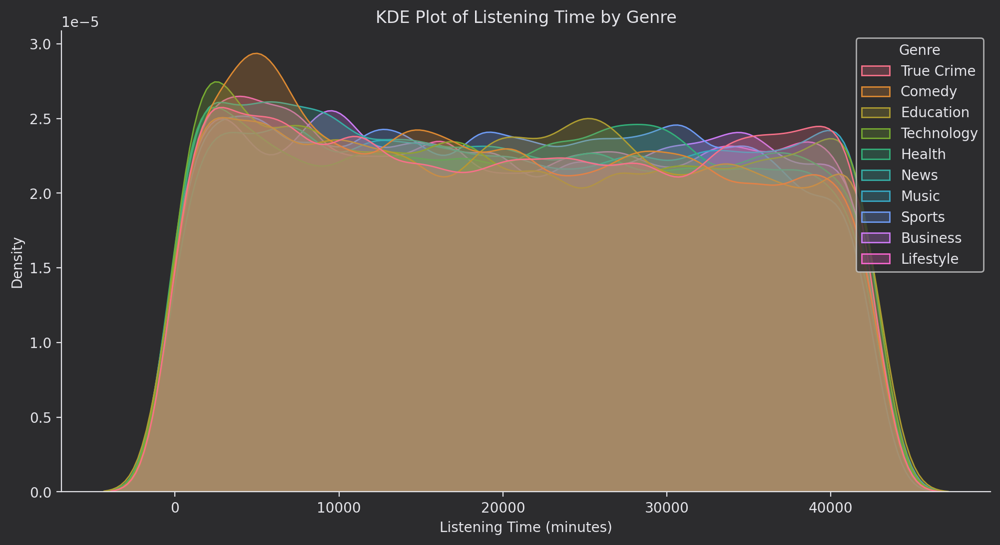

In [26]:
plt.figure(figsize=(12,6))
sns.kdeplot(data=df, x='Listening_Time_minutes', hue='Genre', fill=True, common_norm=False)
plt.title('KDE Plot of Listening Time by Genre')
plt.xlabel('Listening Time (minutes)')
plt.ylabel('Density')
plt.show()


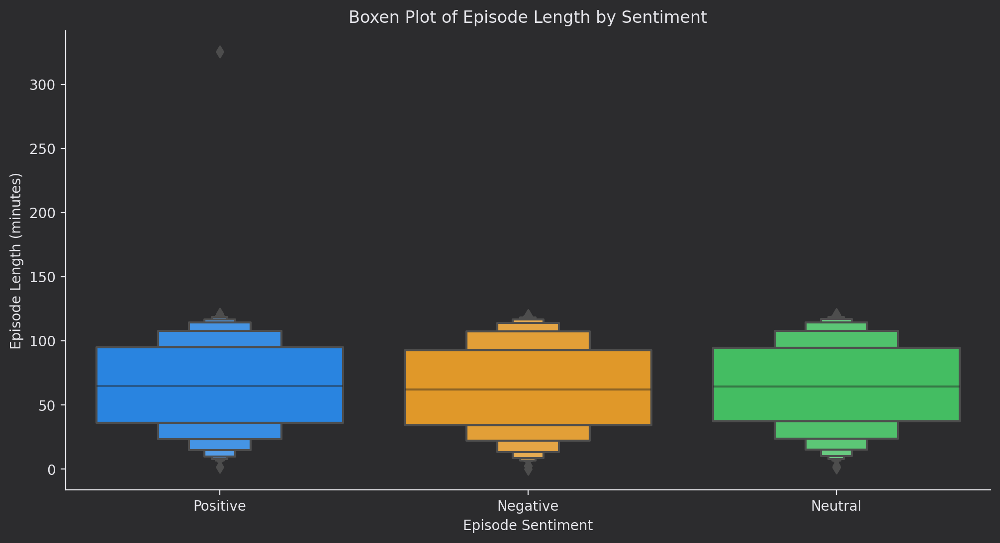

In [27]:
plt.figure(figsize=(12,6))
sns.boxenplot(x='Episode_Sentiment', y='Episode_Length_minutes', data=df)
plt.title('Boxen Plot of Episode Length by Sentiment')
plt.xlabel('Episode Sentiment')
plt.ylabel('Episode Length (minutes)')
plt.show()


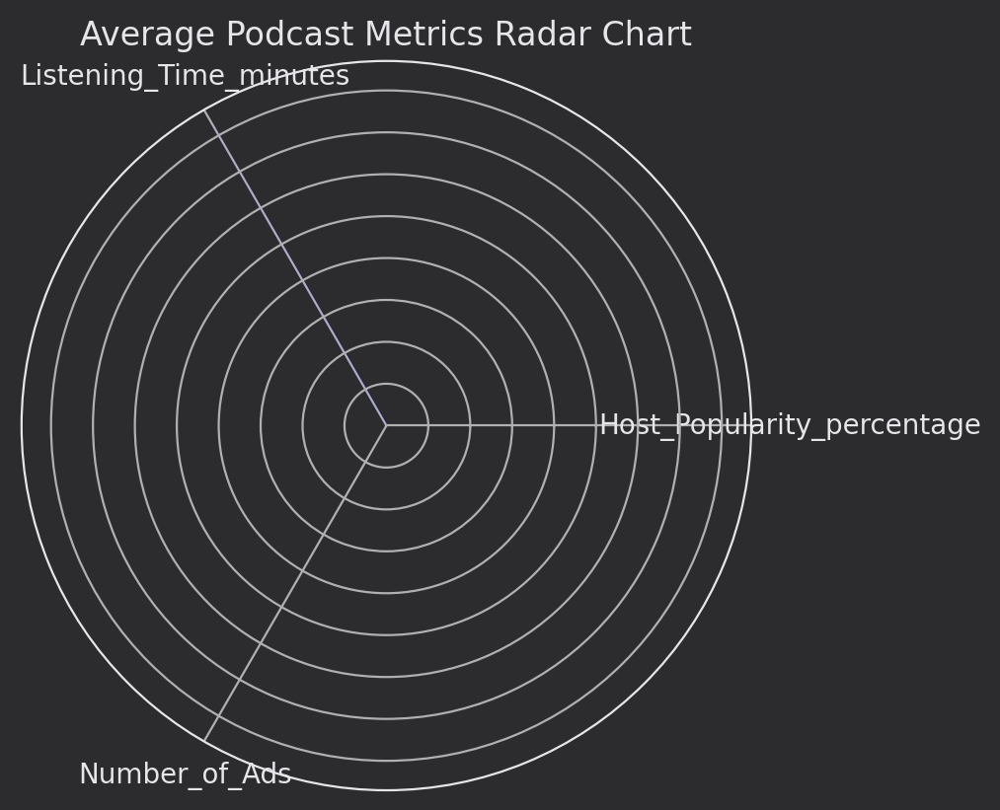

In [28]:
from math import pi

# Prepare data for Radar Chart
categories = ['Host_Popularity_percentage', 'Listening_Time_minutes', 'Number_of_Ads']
values = df[categories].mean().values.flatten().tolist()

# Number of variables
num_vars = len(categories)

# Compute angle for each axis
angles = [n / float(num_vars) * 2 * pi for n in range(num_vars)]
values += values[:1]  # Repeat the first value to close the circle
angles += angles[:1]   # Repeat the first angle to close the circle

# Draw radar chart
ax = plt.subplot(111, polar=True)
ax.fill(angles, values, color='blue', alpha=0.25)
ax.set_yticklabels([])
ax.set_xticks(angles[:-1])
ax.set_xticklabels(categories)
plt.title('Average Podcast Metrics Radar Chart')
plt.show()


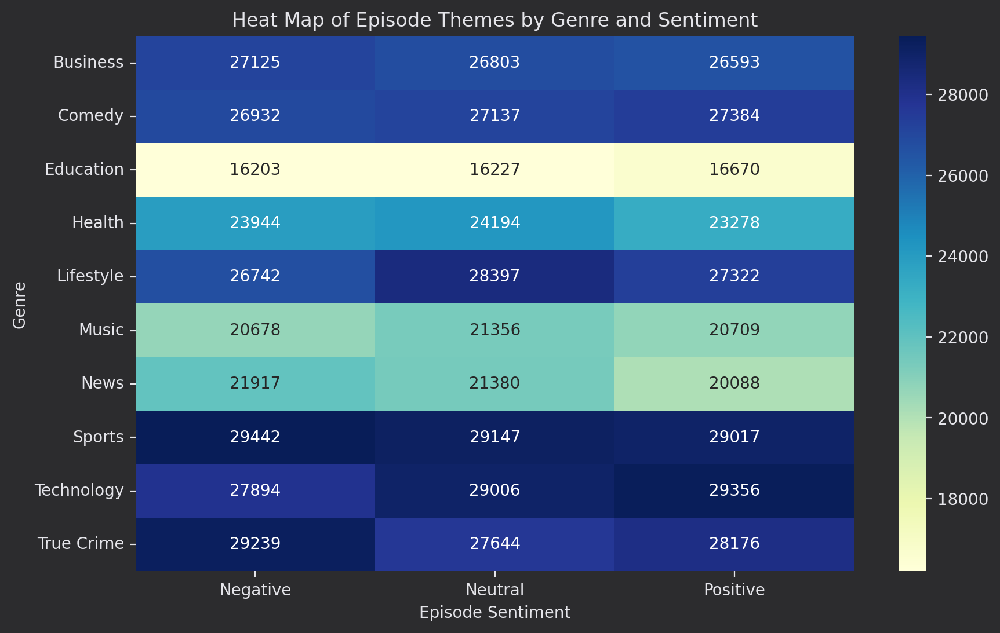

In [29]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Create a pivot table for heat map
pivot_table = df.pivot_table(index='Genre', columns='Episode_Sentiment', aggfunc='size', fill_value=0)

# Plot heat map
plt.figure(figsize=(10, 6))
sns.heatmap(pivot_table, annot=True, fmt="d", cmap="YlGnBu")
plt.title('Heat Map of Episode Themes by Genre and Sentiment')
plt.xlabel('Episode Sentiment')
plt.ylabel('Genre')
plt.show()


# Work in Progress 
## More content to be added , along with write-up for the notebook